### Анализ полного набора данных с помощью `vaex`

TODO: визуализация полного набора данных  
Библиотека `vaex` (https://vaex.io/docs/, https://github.com/vaexio/vaex) для работы в большими наборами данных.  

In [29]:
import vaex
vaex.multithreading.thread_count_default = 8
import vaex.ml
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, accuracy_score
from sklearn.ensemble import RandomForestClassifier

SEED = 42

Создание [HDF-файла](https://en.wikipedia.org/wiki/Hierarchical_Data_Format) из исходного CSV-файла с данными.  

In [27]:
data_vaex = vaex.from_csv('data/lc_sample.csv', sep=';', convert=True, copy_index=False, chunk_size=5_000_000)
train_data_vaex = vaex.from_csv('data/lc_sample_train.csv', sep=';', convert=True, copy_index=False, chunk_size=5_000_000)
control_data_vaex = vaex.from_csv('data/lc_sample_control.csv', sep=';', convert=True, copy_index=False, chunk_size=5_000_000)

In [28]:
data_vaex.describe()

,CLASS,X,Y,WINTER1,WINTER2,SPRING1,SPRING2,SPRING3,SUMMER1,SUMMER2,SUMMER3,FALL1,FALL2,FALL3
data_type,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64
count,74029669,74029669,74029669,74029669,74029669,74029669,74029669,74029669,74029669,74029669,74029669,74029669,74029669,74029669
NA,0,0,0,0,0,0,0,0,0,0,0,0,0,0
mean,7.611119766049474,24376.72315124089,12002.401741320768,4548.318077161739,4731.401958476945,548.9832983448839,2052.998122860714,1848.420739284948,421.4262774834236,2556.332150843468,1787.649052544055,512.4376927580211,2131.846159666066,1697.7642905846303
std,6.342813,8210.278115,3491.21563,2416.994088,2041.213183,222.399708,591.359357,544.045962,251.964254,701.879185,547.615536,253.744844,548.47765,582.313616
min,1,5820,1429,0,0,1,1,1,1,1,1,1,1,1
max,23,40161,20580,10583,10584,8653,7018,5211,8653,6907,4923,8653,6907,5280


Зная минимальные и максимальные значения для каждого признака, можно подобрать типы данных меньшего размера, чем по умолчанию, для хранения этих признаков, возможно, это позволит держать в оперативной памяти полный набор данных и оперировать им.  
см. [Kaggle: Tutorial on reading large datasets](https://www.kaggle.com/code/rohanrao/tutorial-on-reading-large-datasets/notebook#Method:-Pandas)  

In [31]:
data_vaex.column_names

['CLASS',
 'X',
 'Y',
 'WINTER1',
 'WINTER2',
 'SPRING1',
 'SPRING2',
 'SPRING3',
 'SUMMER1',
 'SUMMER2',
 'SUMMER3',
 'FALL1',
 'FALL2',
 'FALL3']

In [33]:
np.iinfo(np.uint8)

iinfo(min=0, max=255, dtype=uint8)

In [34]:
np.iinfo(np.uint16)

iinfo(min=0, max=65535, dtype=uint16)

In [30]:
dtypes = {
    'CLASS': 'uint8',  # (0, 255)
    'X': 'uint16',  # (0, 65535)
    'Y': 'uint16',
    'WINTER1': 'uint16',
    'WINTER2': 'uint16',
    'SPRING1': 'uint16',
    'SPRING2': 'uint16',
    'SPRING3': 'uint16',
    'SUMMER1': 'uint16',
    'SUMMER2': 'uint16',
    'SUMMER3': 'uint16',
    'FALL1': 'uint16',
    'FALL2': 'uint16',
    'FALL3': 'uint16'
}

### Проверка модели случайного леса на полном наборе данных

In [35]:
%%time

train_data = pd.read_csv('data/lc_sample_train.csv', sep=';', dtype=dtypes)
print("Train dataset size:", train_data.shape)

Train dataset size: (2000000, 14)
CPU times: total: 2.16 s
Wall time: 2.76 s


In [41]:
%%time

control_data = pd.read_csv('data/lc_sample_control.csv', sep=';', dtype=dtypes)
print("Control dataset size:", control_data.shape)

Control dataset size: (72029669, 14)
CPU times: total: 1min 9s
Wall time: 1min 17s


In [36]:
%%time

X_train = train_data.loc[:, train_data.columns != 'CLASS']
y_train = train_data.loc[:, 'CLASS']
X_train.shape, y_train.shape

CPU times: total: 62.5 ms
Wall time: 103 ms


((2000000, 13), (2000000,))

In [46]:
%%time

X_control = control_data.loc[:, control_data.columns != 'CLASS']
y_control = control_data.loc[:, 'CLASS']
X_control.shape, y_control.shape

CPU times: total: 12.8 s
Wall time: 38.7 s


((72029669, 13), (72029669,))

In [37]:
X_train, X_test, y_train, y_test = train_test_split(X_train, y_train, test_size=0.9, random_state=SEED)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((200000, 13), (1800000, 13), (200000,), (1800000,))

In [4]:
%%time

for i, chunk in enumerate(pd.read_csv('data/lc_sample_control.csv', chunksize=5000000)):
    chunk.to_csv(f'data/lc_sample_control_chunk_{i}.csv', index=False)

In [38]:
rf = RandomForestClassifier(random_state=SEED)

In [39]:
%%time

rf.fit(X_train, y_train)

CPU times: total: 1min 29s
Wall time: 1min 32s


RandomForestClassifier(random_state=42)

In [40]:
%%time

rf_test_pred = rf.predict(X_test)
rf_test_mse = mean_squared_error(y_test, rf_test_pred)
rf_test_accuracy = accuracy_score(y_test, rf_test_pred)
print("RandomForest MSE: {:.3f}".format(rf_test_mse))
print("RandomForest accuracy: {:.3f}".format(rf_test_accuracy))

RandomForest MSE: 2.053
RandomForest accuracy: 0.954
CPU times: total: 1min 22s
Wall time: 1min 26s


In [43]:
result = pd.concat([y_test, X_test], axis=1)[['CLASS', 'X', 'Y']]
result['PRED'] = rf_test_pred
result['ERROR'] = result['CLASS'] == result['PRED']
result

,CLASS,X,Y,PRED,ERROR
1828401,3,19839,16980,3,True
1200071,4,30662,13099,4,True
194849,6,13775,7499,6,True
1629054,8,31509,15279,8,True
191144,17,23104,7468,17,True
...,...,...,...,...,...
1739279,4,33077,16137,4,True
414444,4,35324,8858,4,True
976202,4,25792,12009,4,True
1222976,4,25476,13197,4,True


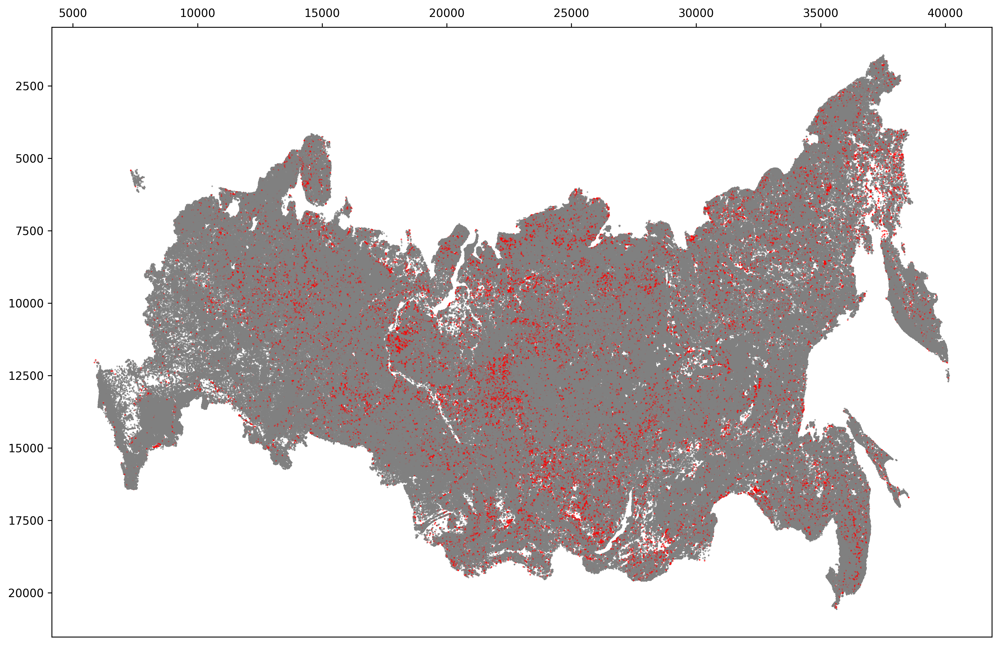

In [48]:
def render_class_map():
    fig, ax = plt.subplots(figsize=(15, 10), dpi=300)
    plt.gca().invert_yaxis()
    ax.xaxis.tick_top()

    colors_dict = {
        True: 'grey',
        False: 'red'
    }
    colors = [colors_dict[value] for value in result['ERROR']]

    plt.scatter(result['X'], result['Y'], c=colors, s=0.1)

    # plt.title(classes_legend[class_id]['name'])
    plt.show()


render_class_map()

In [55]:
for class_id in classes_legend:
    tot = len(result[result['CLASS'] == class_id])
    res = len(result[result['CLASS'] == class_id][result['ERROR'] == False])
    print(classes_legend[class_id]['name'], tot, res, res / tot * 100)

C:\Users\Evgenia\AppData\Local\Temp\ipykernel_2932\1876436457.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  res = len(result[result['CLASS'] == class_id][result['ERROR'] == False])


Темнохвойный лес 150248 5448 3.6260050050583033
Светлохвойный лес 109435 11892 10.86672453968109
Лиственный лес 212668 7039 3.3098538567156317
Хвойный листопадный лес 540764 8127 1.5028737120074562
Хвойный кустарник 26685 1762 6.602960464680533
Болота 74604 1854 2.4851214412095866
Болота 24920 1859 7.459871589085072
Луга 142196 2941 2.0682719626431125
Лиственный кустарник 6527 3057 46.83621878351463
Смешанный лес с преобладанием хвойных 25026 6111 24.418604651162788
Смешанный лес 9330 3847 41.23258306538049
Смешанный лес с преобладанием лиственных 36766 4685 12.74275145514878
Открытые грунты и выходы горных пород 65022 996 1.531789240564732
Степь 50926 581 1.1408710678239014
Прибрежная растительность 233 217 93.13304721030042
Кустарниковая тундра 28631 3955 13.813698438755196
Травянистая тундра 118359 4765 4.025887342745376
Кустарничковая тундра 47193 7188 15.231072404805799
Открытые грунты и выходы горных пород 81 81 100.0
Водные объекты 29172 179 0.6136020841903195
Болота 4496 920 20

In [12]:
%%time

for i in range(15):
    control_data = pd.read_csv(f'data/lc_sample_control_chunk_{i}.csv', sep=';', dtype=dtypes)
    print(f"{i} control dataset size:", control_data.shape)
    X_control = control_data.loc[:, control_data.columns != 'CLASS']
    y_control = control_data.loc[:, 'CLASS']
    rf_control_pred = rf.predict(X_control)
    rf_control_mse = mean_squared_error(y_control, rf_control_pred)
    rf_control_accuracy = accuracy_score(y_control, rf_control_pred)
    print("RandomForest MSE: {:.3f}".format(rf_control_mse))
    print("RandomForest accuracy: {:.3f}".format(rf_control_accuracy))

0 control dataset size: (5000000, 14)
RandomForest MSE: 1.831
RandomForest accuracy: 0.947
1 control dataset size: (5000000, 14)
RandomForest MSE: 1.781
RandomForest accuracy: 0.940
2 control dataset size: (5000000, 14)
RandomForest MSE: 1.990
RandomForest accuracy: 0.956
3 control dataset size: (5000000, 14)
RandomForest MSE: 3.253
RandomForest accuracy: 0.941
4 control dataset size: (5000000, 14)
RandomForest MSE: 3.182
RandomForest accuracy: 0.952
5 control dataset size: (5000000, 14)
RandomForest MSE: 2.928
RandomForest accuracy: 0.959
6 control dataset size: (5000000, 14)
RandomForest MSE: 2.365
RandomForest accuracy: 0.962
7 control dataset size: (5000000, 14)
RandomForest MSE: 1.889
RandomForest accuracy: 0.962
8 control dataset size: (5000000, 14)
RandomForest MSE: 1.528
RandomForest accuracy: 0.958
9 control dataset size: (5000000, 14)
RandomForest MSE: 1.339
RandomForest accuracy: 0.960
10 control dataset size: (5000000, 14)
RandomForest MSE: 1.240
RandomForest accuracy: 0.96

### Предобработка данных

Для случайного леса предобработка данных не нужна.  
см. https://stats.stackexchange.com/questions/172842/best-practices-with-data-wrangling-before-running-random-forest-predictions

### Метрики

https://scikit-learn.org/stable/modules/model_evaluation.html#classification-metrics

In [56]:
%%time

rf_control_pred = rf.predict(X_control, dtype='uint8')
rf_control_mse = mean_squared_error(y_control, rf_control_pred)
rf_control_accuracy = accuracy_score(y_control, rf_control_pred)
print("RandomForest MSE: {:.3f}".format(rf_control_mse))
print("RandomForest accuracy: {:.3f}".format(rf_control_accuracy))

TypeError: predict() got an unexpected keyword argument 'dtype'

In [25]:
# {name: '' for name in data.column_names}
# info = np.iinfo(np.int16)
# info.min, info.max

# features_min_max = {}
# for column_name in data.column_names:
#     features_min_max[column_name] = (data[column_name].min, data[column_name].max)

# data.minmax(data.column_names)

KeyboardInterrupt: 

In [ ]:
dtypes = {
    'CLASS': 'uint8',  # (0, 255)
    'X': 'uint16',  # (0, 65535)
    'Y': 'uint16',
    'WINTER1': 'uint16',
    'WINTER2': 'uint16',
    'SPRING1': 'uint16',
    'SPRING2': 'uint16',
    'SPRING3': 'uint16',
    'SUMMER1': 'uint16',
    'SUMMER2': 'uint16',
    'SUMMER3': 'uint16',
    'FALL1': 'uint16',
    'FALL2': 'uint16',
    'FALL3': 'uint16'
}

In [45]:
def parse_classes(filename: str) -> dict:
    """Parsing classes legend from text file.
    
    Parameters
    ----------
    filename : string
        Input textfile name.
    
    Returns
    -------
    classes : dict
        Classes legend.
    """
    classes = {}
    with open(filename, mode='rt', encoding='utf-8') as f:
        for line in f:
            key, value = line.rstrip().split('. ')
            classes[int(key)] = {'name': value}
    return classes


classes_legend = parse_classes('data/33class_legend_rus.txt')

classes = train_data.CLASS.unique()
classes.sort()

classes_legend = { key: classes_legend[key] for key in classes }

# for c in classes:
#     print(f"{c}: {classes_legend[c]['name']} ({data[data.CLASS == c].shape[0]})")

### Обучение

In [3]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, accuracy_score
from sklearn.ensemble import RandomForestClassifier
import vaex.ml

SEED = 42

In [4]:
train_data.shuffle().export("data/lc_sample_train.csv_shuffled.hdf5")
df = vaex.open("data/lc_sample_train.csv_shuffled.hdf5")
df_train, df_test = train_data.ml.train_test_split(test_size=0.9)
features = df_train.column_names[1:]
features

d:\Projects\masters-term-paper\venv\lib\site-packages\vaex\ml\__init__.py:28: UserWarning: Make sure the DataFrame is shuffled
  warnings.warn('Make sure the DataFrame is shuffled')


['X',
 'Y',
 'WINTER1',
 'WINTER2',
 'SPRING1',
 'SPRING2',
 'SPRING3',
 'SUMMER1',
 'SUMMER2',
 'SUMMER3',
 'FALL1',
 'FALL2',
 'FALL3']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.9, random_state=SEED)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

In [6]:
rf = RandomForestClassifier(random_state=SEED)

In [ ]:
rf.fit(X_train, Y_train)
rf_test_pred = rf.predict(X_test)
rf_test_mse = mean_squared_error(Y_test, rf_test_pred)
rf_test_accuracy = accuracy_score(Y_test, rf_test_pred)
print("RandomForest MSE: {:.3f}".format(rf_test_mse))
print("RandomForest accuracy: {:.3f}".format(rf_test_accuracy))

In [ ]:
rf_model_coefs = rf.feature_importances_
ncoef = rf_model_coefs.shape[0]
default_x = np.arange(ncoef)

plt.figure(figsize=(12,4))
plt.bar(default_x - 0.1, rf_model_coefs, label="RandomForest", width=0.1, color = 'red')
plt.xticks(default_x)
plt.xlabel('Coefficient Index')
plt.ylabel('Coefficient Magnitude')
plt.legend(loc='upper right')
plt.grid()
plt.show()

### Other

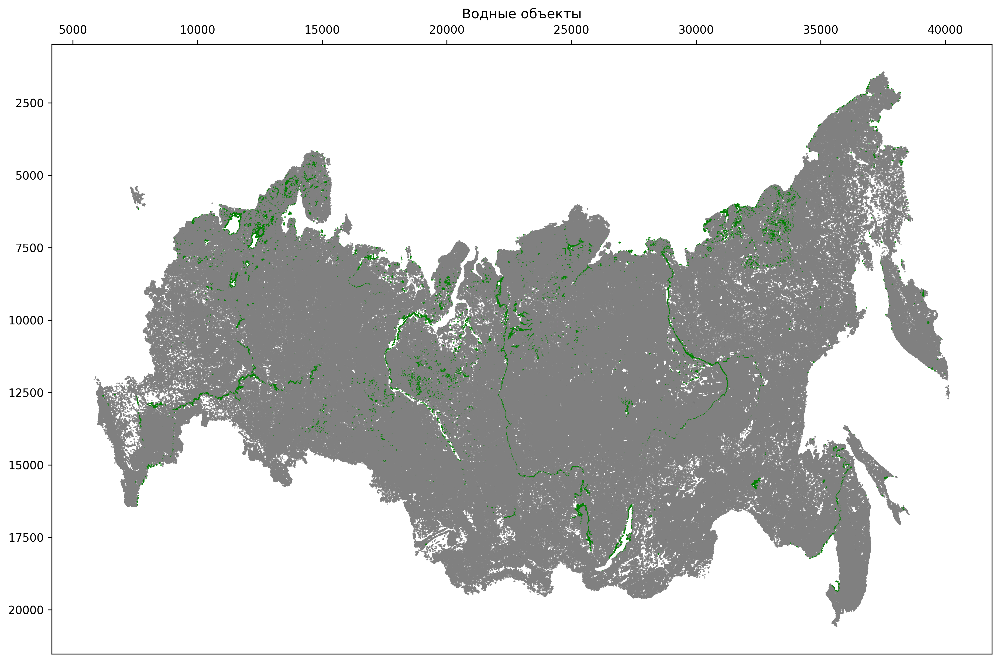

In [8]:
def render_class_map(class_id):
    fig, ax = plt.subplots(figsize=(15, 10), dpi=300)
    plt.gca().invert_yaxis()
    ax.xaxis.tick_top()

    selection = train_data['CLASS'] == class_id
    selected_data = train_data[['X', 'Y', 'CLASS']]
    selected_data['IN_CLASS'] = selection
    colors_dict = {
        True: 'green',
        False: 'grey'
    }
    colors = [colors_dict[value] for value in selected_data['IN_CLASS'].evaluate()]

    plt.scatter(selected_data['X'].evaluate(), selected_data['Y'].evaluate(), c=colors, s=0.1)

    plt.title(classes_legend[class_id]['name'])
    plt.show()


class_id = 20
render_class_map(class_id)

In [ ]:
import matplotlib.cm as cm
from matplotlib.colors import Normalize

fig, ax = plt.subplots(figsize=(15, 10), dpi=300)
plt.gca().invert_yaxis()
ax.xaxis.tick_top()
plt.scatter(X['X'], X['Y'], s=0.1, c=y.values)
viridis = cm.get_cmap('viridis', 8)
markers = [plt.Line2D([0,0], [0,0], color=color, marker='o', linestyle='') for color in viridis(np.linspace(0, 1, 33))]
# plt.legend(markers, classes_legend.values(), bbox_to_anchor=(1.36,1), loc='upper right', numpoints=1)
plt.show()

In [10]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

In [12]:
SEED = 42

data = pd.read_csv('data/lc_sample_train.csv', sep=';')
data.head()

,CLASS,X,Y,WINTER1,WINTER2,SPRING1,SPRING2,SPRING3,SUMMER1,SUMMER2,SUMMER3,FALL1,FALL2,FALL3
0,13,37515,1434,9940,9614,602,928,1977,776,928,1977,625,863,1771
1,17,37496,1463,8480,7907,870,3051,2790,714,3051,2790,836,3437,2777
2,13,37534,1465,6870,6161,724,1419,2345,953,1419,2345,649,1171,2122
3,17,37506,1470,7691,7125,913,3062,2719,983,3062,2719,769,2399,2614
4,17,37514,1471,9179,8623,878,3213,2672,774,3213,2672,894,3181,3002


In [3]:
test_data = pd.read_csv('data/lc_sample_control.csv', sep=';')
test_data.head()

,CLASS,X,Y,WINTER1,WINTER2,SPRING1,SPRING2,SPRING3,SUMMER1,SUMMER2,SUMMER3,FALL1,FALL2,FALL3
0,20,37492,1429,5517,4840,406,450,264,375,450,264,406,450,264
1,20,37494,1429,6099,5531,499,580,349,224,580,349,499,580,349
2,20,37495,1429,6351,5795,533,578,596,186,578,596,533,578,596
3,20,37496,1429,6729,6179,379,411,573,196,411,573,379,411,573
4,20,37487,1431,7467,6886,197,158,90,185,158,90,145,68,3


In [15]:
X_test_control = test_data.loc[:, test_data.columns != 'CLASS']
y_test_control = test_data.loc[:, 'CLASS']

MemoryError: Unable to allocate 6.98 GiB for an array with shape (13, 72029669) and data type int64

In [9]:
set(y_test.values)

{1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23}

In [13]:
X = data.loc[:, data.columns != 'CLASS']
y = data.loc[:, 'CLASS']

train_classes_legend = { key: classes_legend[key] for key in set(y.values) }
train_classes_legend

{1: {'name': 'Темнохвойный лес'},
 2: {'name': 'Светлохвойный лес'},
 3: {'name': 'Лиственный лес'},
 4: {'name': 'Хвойный листопадный лес'},
 5: {'name': 'Хвойный кустарник'},
 6: {'name': 'Болота'},
 7: {'name': 'Болота'},
 8: {'name': 'Луга'},
 9: {'name': 'Лиственный кустарник'},
 10: {'name': 'Смешанный лес с преобладанием хвойных'},
 11: {'name': 'Смешанный лес'},
 12: {'name': 'Смешанный лес с преобладанием лиственных'},
 13: {'name': 'Открытые грунты и выходы горных пород'},
 14: {'name': 'Степь'},
 15: {'name': 'Прибрежная растительность'},
 16: {'name': 'Кустарниковая тундра'},
 17: {'name': 'Травянистая тундра'},
 18: {'name': 'Кустарничковая тундра'},
 19: {'name': 'Открытые грунты и выходы горных пород'},
 20: {'name': 'Водные объекты'},
 21: {'name': 'Болота'},
 22: {'name': 'Болота'},
 23: {'name': 'Редины хвойные листопадные'}}

In [72]:
import matplotlib.cm as cm

colors = cm.get_cmap('viridis')(np.linspace(0, 1, len(classes_legend)))
for key, color in zip(classes_legend, colors):
    classes_legend[key]['color'] = color
# classes_colormap = {key: color for key, color in zip(classes_legend, colors)}

# markers = [plt.Line2D([0,0], [0,0], color=color, marker='o', linestyle='') for color in classes_colormap.values()]
# plt.legend(markers, classes_legend.values(), bbox_to_anchor=(2,1), loc='upper right', numpoints=1)
# plt.show()
classes_legend.values()['color']

TypeError: 'dict_values' object is not subscriptable

In [ ]:
import matplotlib.cm as cm
from matplotlib.colors import Normalize

fig, ax = plt.subplots(figsize=(15, 10), dpi=300)
plt.gca().invert_yaxis()
ax.xaxis.tick_top()
plt.scatter(X['X'], X['Y'], s=0.1, c=y.values)

markers = [plt.Line2D([0,0], [0,0], color=color, marker='o', linestyle='') for color in viridis(np.linspace(0, 1, 33))]
plt.legend(markers, classes_legend.values(), bbox_to_anchor=(1.36,1), loc='upper right', numpoints=1)
plt.show()

23

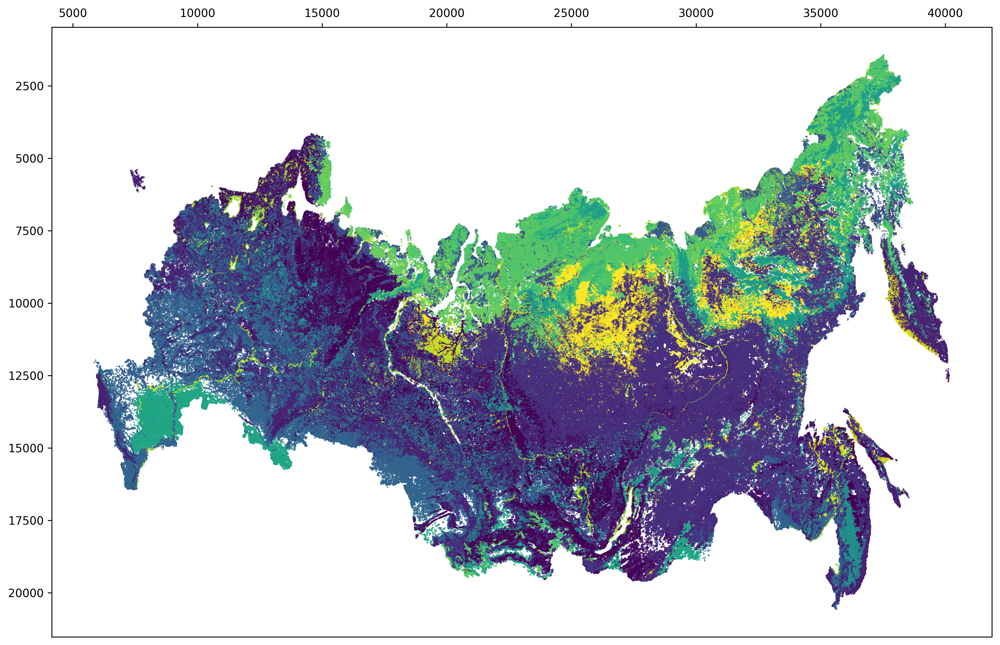

In [16]:
import matplotlib.cm as cm
from matplotlib.colors import Normalize

fig, ax = plt.subplots(figsize=(15, 10), dpi=300)
plt.gca().invert_yaxis()
ax.xaxis.tick_top()
plt.scatter(X['X'], X['Y'], s=0.1, c=y.values)
viridis = cm.get_cmap('viridis', 8)
markers = [plt.Line2D([0,0], [0,0], color=color, marker='o', linestyle='') for color in viridis(np.linspace(0, 1, 33))]
# plt.legend(markers, classes_legend.values(), bbox_to_anchor=(1.36,1), loc='upper right', numpoints=1)
plt.show()

In [14]:
from sklearn.model_selection import train_test_split


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.9, random_state=SEED)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((200000, 13), (1800000, 13), (200000,), (1800000,))

### Training

In [7]:
from sklearn.metrics import mean_squared_error, accuracy_score
from sklearn.linear_model import SGDClassifier
from sklearn.ensemble import RandomForestClassifier

In [57]:
rf = RandomForestClassifier(random_state=SEED)

In [58]:
rf.fit(X_train, Y_train)
rf_test_pred = rf.predict(X_test)
rf_test_mse = mean_squared_error(Y_test, rf_test_pred)
rf_test_accuracy = accuracy_score(Y_test, rf_test_pred)
print("RandomForest MSE: {:.3f}".format(rf_test_mse))
print("RandomForest accuracy: {:.3f}".format(rf_test_accuracy))

RandomForest MSE: 3.478
RandomForest accuracy: 0.954


In [60]:
sgd = SGDClassifier()

In [61]:
sgd.fit(X_train, Y_train)
sgd_test_pred = sgd.predict(X_test)
sgd_test_mse = mean_squared_error(Y_test, sgd_test_pred)
sgd_test_accuracy = accuracy_score(Y_test, sgd_test_pred)
print("SGDClassifier MSE: {:.3f}".format(sgd_test_mse))
print("SGDClassifier accuracy: {:.3f}".format(sgd_test_accuracy))

SGDClassifier MSE: 31.048
SGDClassifier accuracy: 0.697


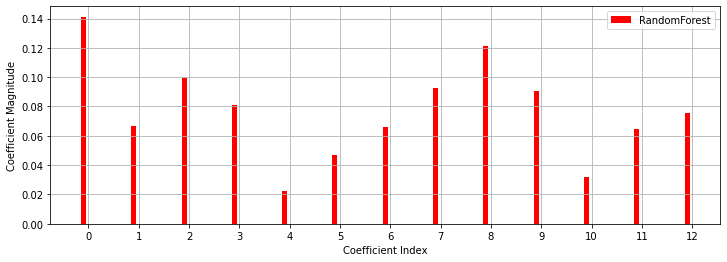

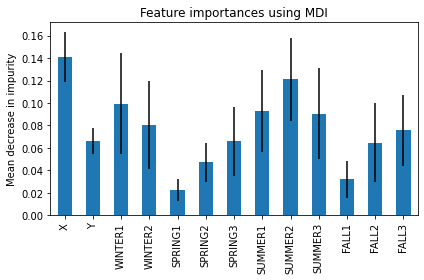

In [19]:
import matplotlib.pyplot as plt

rf_model_coefs = rf.feature_importances_
ncoef = rf_model_coefs.shape[0]
default_x = np.arange(ncoef)

plt.figure(figsize=(12,4))
plt.bar(default_x - 0.1, rf_model_coefs, label="RandomForest", width=0.1, color = 'red')
plt.xticks(default_x)
plt.xlabel('Coefficient Index')
plt.ylabel('Coefficient Magnitude')
plt.legend(loc='upper right')
plt.grid()
plt.show()


feature_names = X_train.columns
std = np.std([tree.feature_importances_ for tree in rf.estimators_], axis=0)
forest_importances = pd.Series(rf_model_coefs, index=feature_names)

fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=std, ax=ax)
ax.set_title("Feature importances using MDI")
ax.set_ylabel("Mean decrease in impurity")
fig.tight_layout()

In [30]:
X_train.columns

Index(['X', 'Y', 'WINTER1', 'WINTER2', 'SPRING1', 'SPRING2', 'SPRING3',
       'SUMMER1', 'SUMMER2', 'SUMMER3', 'FALL1', 'FALL2', 'FALL3'],
      dtype='object')

In [16]:
plt.scatter.c

AttributeError: 'function' object has no attribute 'c'

In [14]:
for color in classes_legend.keys():
    print(color, cm.viridis(color))

0 (0.267004, 0.004874, 0.329415, 1.0)
1 (0.26851, 0.009605, 0.335427, 1.0)
2 (0.269944, 0.014625, 0.341379, 1.0)
3 (0.271305, 0.019942, 0.347269, 1.0)
4 (0.272594, 0.025563, 0.353093, 1.0)
5 (0.273809, 0.031497, 0.358853, 1.0)
6 (0.274952, 0.037752, 0.364543, 1.0)
7 (0.276022, 0.044167, 0.370164, 1.0)
8 (0.277018, 0.050344, 0.375715, 1.0)
9 (0.277941, 0.056324, 0.381191, 1.0)
10 (0.278791, 0.062145, 0.386592, 1.0)
11 (0.279566, 0.067836, 0.391917, 1.0)
12 (0.280267, 0.073417, 0.397163, 1.0)
13 (0.280894, 0.078907, 0.402329, 1.0)
14 (0.281446, 0.08432, 0.407414, 1.0)
15 (0.281924, 0.089666, 0.412415, 1.0)
16 (0.282327, 0.094955, 0.417331, 1.0)
17 (0.282656, 0.100196, 0.42216, 1.0)
18 (0.28291, 0.105393, 0.426902, 1.0)
19 (0.283091, 0.110553, 0.431554, 1.0)
20 (0.283197, 0.11568, 0.436115, 1.0)
21 (0.283229, 0.120777, 0.440584, 1.0)
22 (0.283187, 0.125848, 0.44496, 1.0)
23 (0.283072, 0.130895, 0.449241, 1.0)
24 (0.282884, 0.13592, 0.453427, 1.0)
25 (0.282623, 0.140926, 0.457517, 1.0)
30 

In [89]:
fig.get_size_inches()

array([12.,  8.])

In [131]:
classes_legend.values()

dict_values(['Фон', 'Темнохвойный лес', 'Светлохвойный лес', 'Лиственный лес', 'Хвойный листопадный лес', 'Хвойный кустарник', 'Болота', 'Болота', 'Луга', 'Лиственный кустарник', 'Смешанный лес с преобладанием хвойных', 'Смешанный лес', 'Смешанный лес с преобладанием лиственных', 'Открытые грунты и выходы горных пород', 'Степь', 'Прибрежная растительность', 'Кустарниковая тундра', 'Травянистая тундра', 'Кустарничковая тундра', 'Открытые грунты и выходы горных пород', 'Водные объекты', 'Болота', 'Болота', 'Редины хвойные листопадные', 'Гари', 'Лиственный лес с хвойным подростом', 'Фон', 'Урбанизированные территории', 'Вечные снега и льды', 'Пахотные земли'])

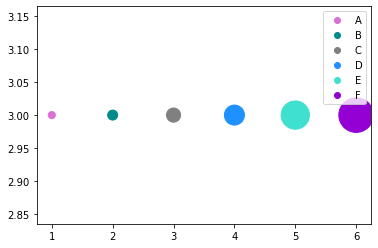

In [4]:
D_id_color = {'A': u'orchid', 'B': u'darkcyan', 'C': u'grey', 'D': u'dodgerblue', 'E': u'turquoise', 'F': u'darkviolet'}
x_coordinates = [1,2,3,4,5,6] # Added missing datapoint
y_coordinates = [3,3,3,3,3,3] # Added missing datapoint
color_map = [color for color in D_id_color.values()]
plt.scatter(x_coordinates,y_coordinates, c = color_map)

# The following two lines generate custom fake lines that will be used as legend entries:
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for color in D_id_color.values()]
plt.legend(markers, D_id_color.keys(), numpoints=1)

plt.show()